# **Proses Segmentasi dan Ekstrasi MFCC**


In [1]:
import os
import random
import librosa, librosa.display
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf
import IPython.display as ipd

Contoh Waveform dan Mel Frequency Cepstral Coefficient yang diambil dari dataset

Audio: blues.00026.au


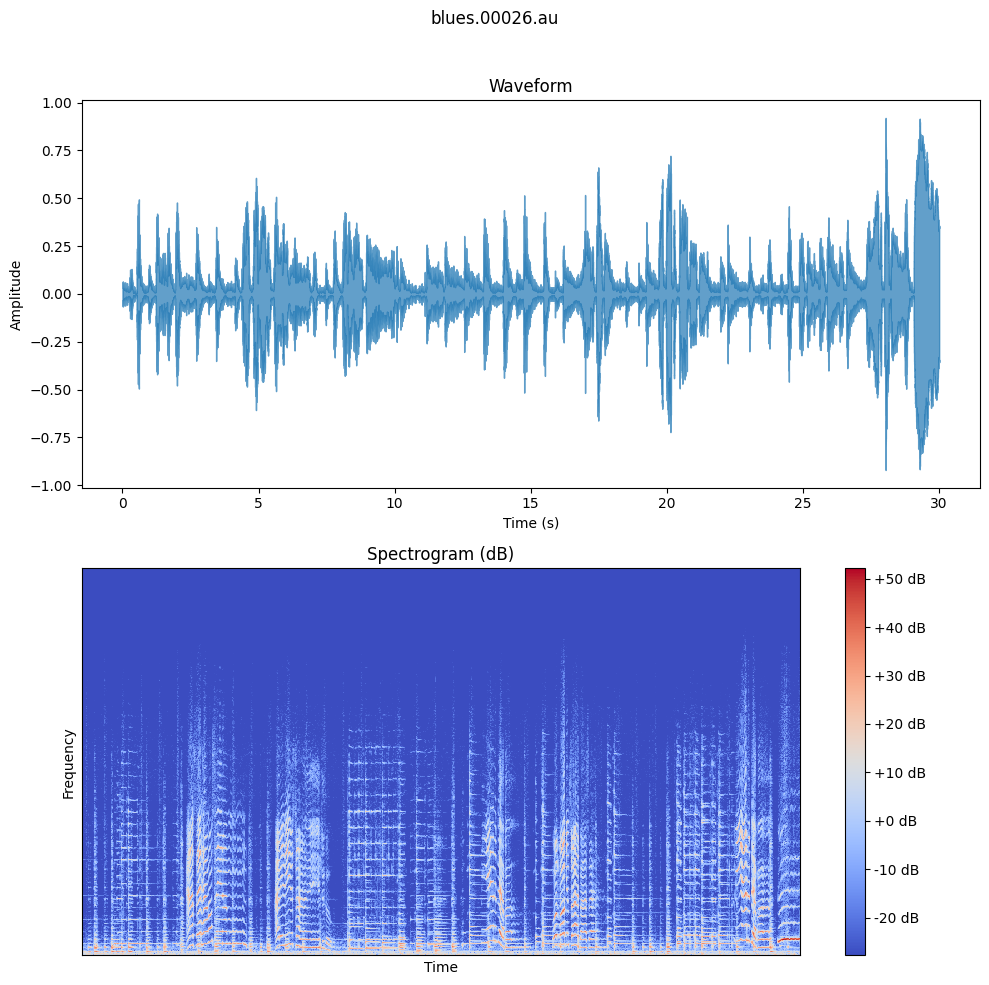

Audio: blues.00021.au


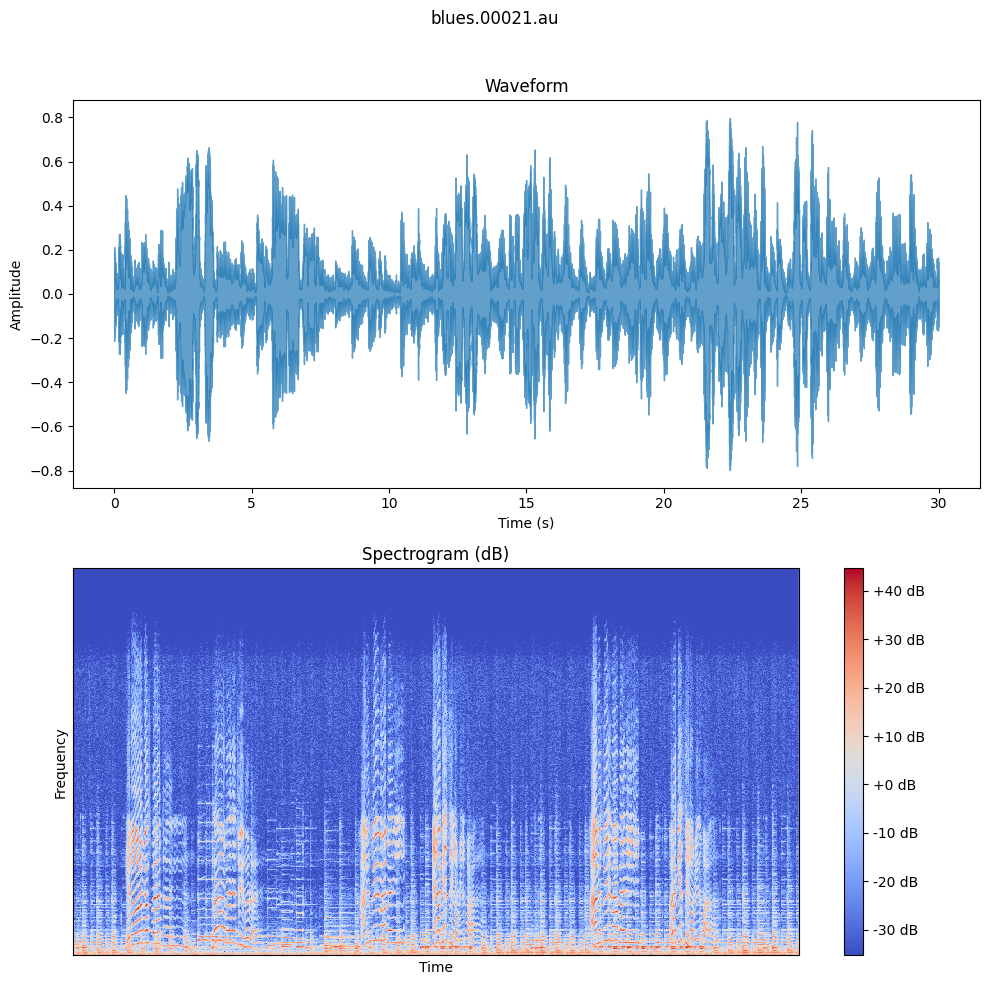

Audio: blues.00015.au


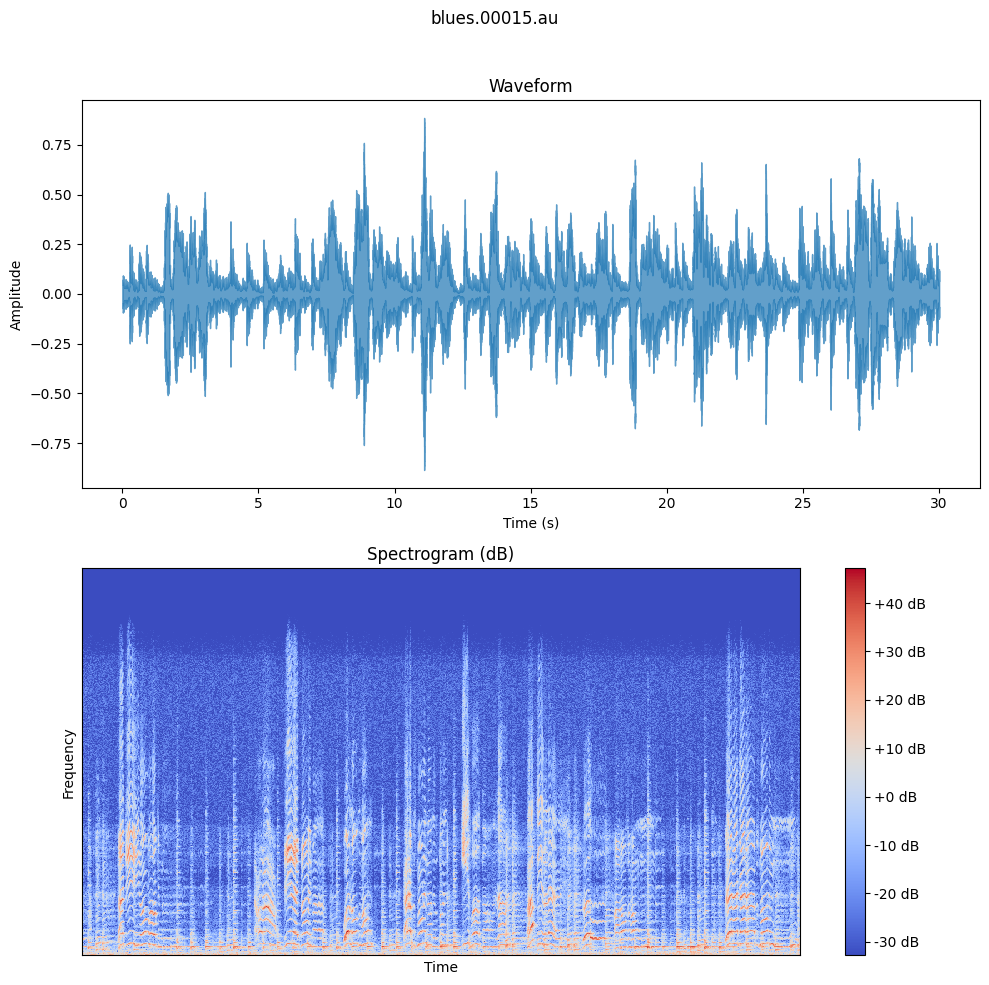

Audio: blues.00007.au


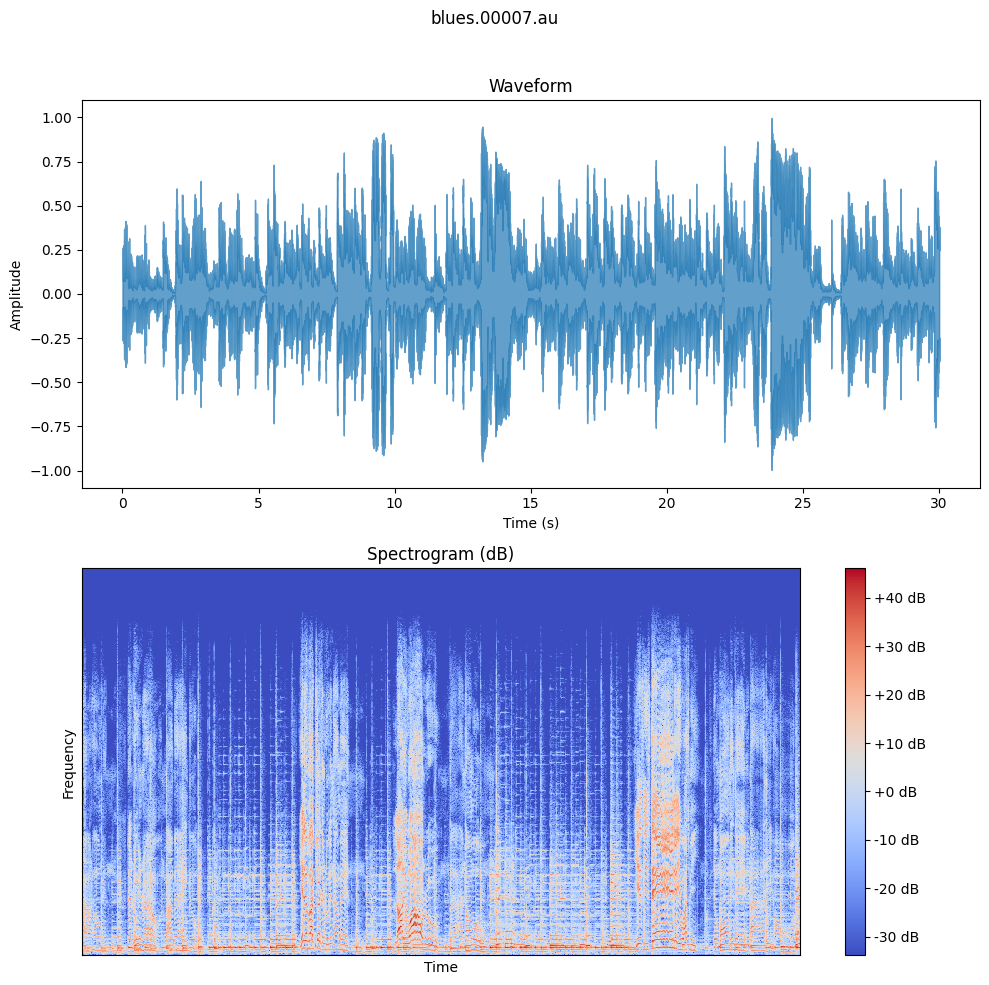

Audio: blues.00025.au


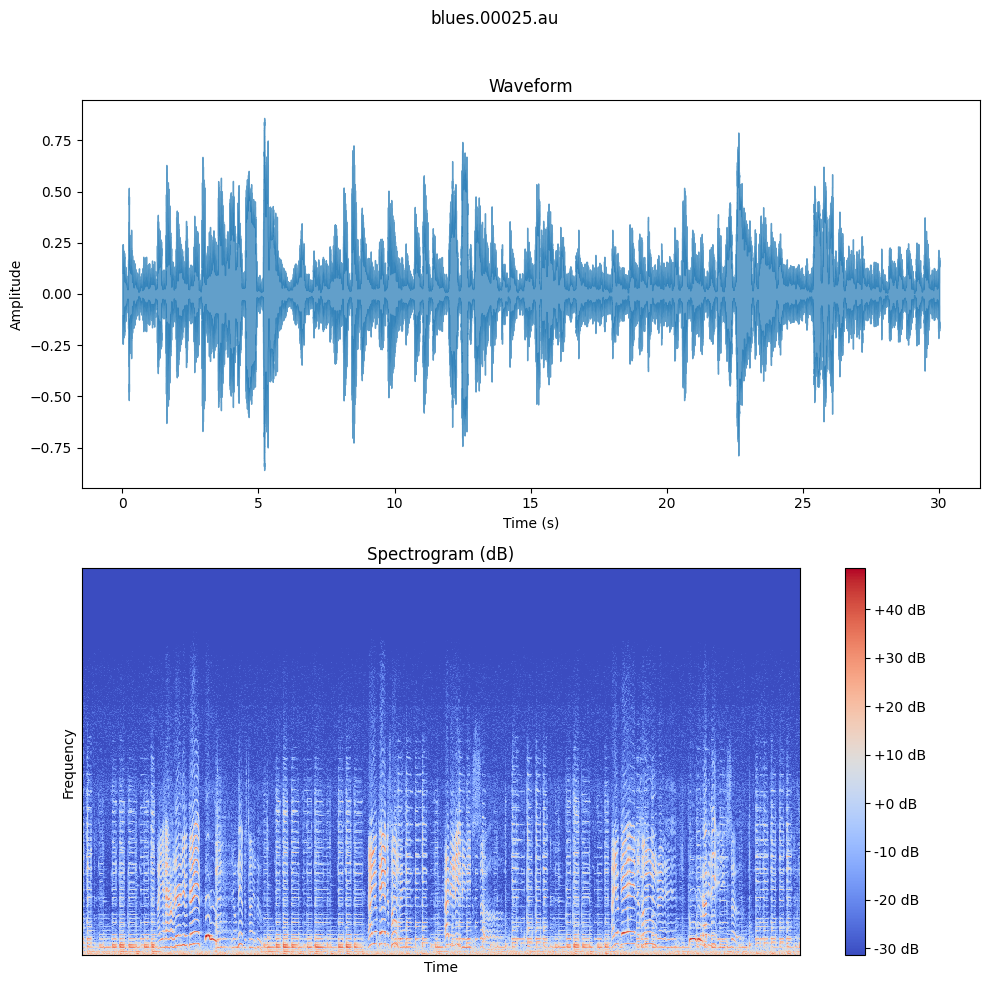

In [2]:
folder_path = "dataset/blues"

all_files = [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(".au")]

num_samples = min(len(all_files), 5)
random_files = random.sample(all_files, num_samples)

FIG_SIZE = (10, 10)
n_fft = 2048
hop_length = 512

def plot_audio_features(file_path):
    signal, sample_rate = librosa.load(file_path, sr=22050)

    stft = librosa.stft(signal, n_fft=n_fft, hop_length=hop_length)
    spectrogram = np.abs(stft)
    log_spectrogram = librosa.amplitude_to_db(spectrogram)

    fig, axes = plt.subplots(2, 1, figsize=FIG_SIZE)
    fig.suptitle(os.path.basename(file_path))

    librosa.display.waveshow(y=signal, sr=sample_rate, alpha=0.7, ax=axes[0])
    axes[0].set_xlabel("Time (s)")
    axes[0].set_ylabel("Amplitude")
    axes[0].set_title("Waveform")

    img = librosa.display.specshow(log_spectrogram, sr=sample_rate, hop_length=hop_length, ax=axes[1])
    axes[1].set_xlabel("Time")
    axes[1].set_ylabel("Frequency")
    axes[1].set_title("Spectrogram (dB)")
    fig.colorbar(img, ax=axes[1], format="%+2.0f dB")

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    sf.write("temp_audio.wav", signal, sample_rate)
    ipd.display(ipd.Audio("temp_audio.wav", rate=sample_rate))

for file in random_files:
    print(f"\033[1mAudio: {os.path.basename(file)}\033[0m")
    plot_audio_features(file)

In [3]:
import math
from tqdm import tqdm
import json

In [4]:
DATASET_PATH = "dataset/"
SAMPLE_RATE = 22050
TRACK_DURATION = 30
SAMPLES_PER_TRACK = SAMPLE_RATE * TRACK_DURATION
OVERLAP_RATIO = 0.5

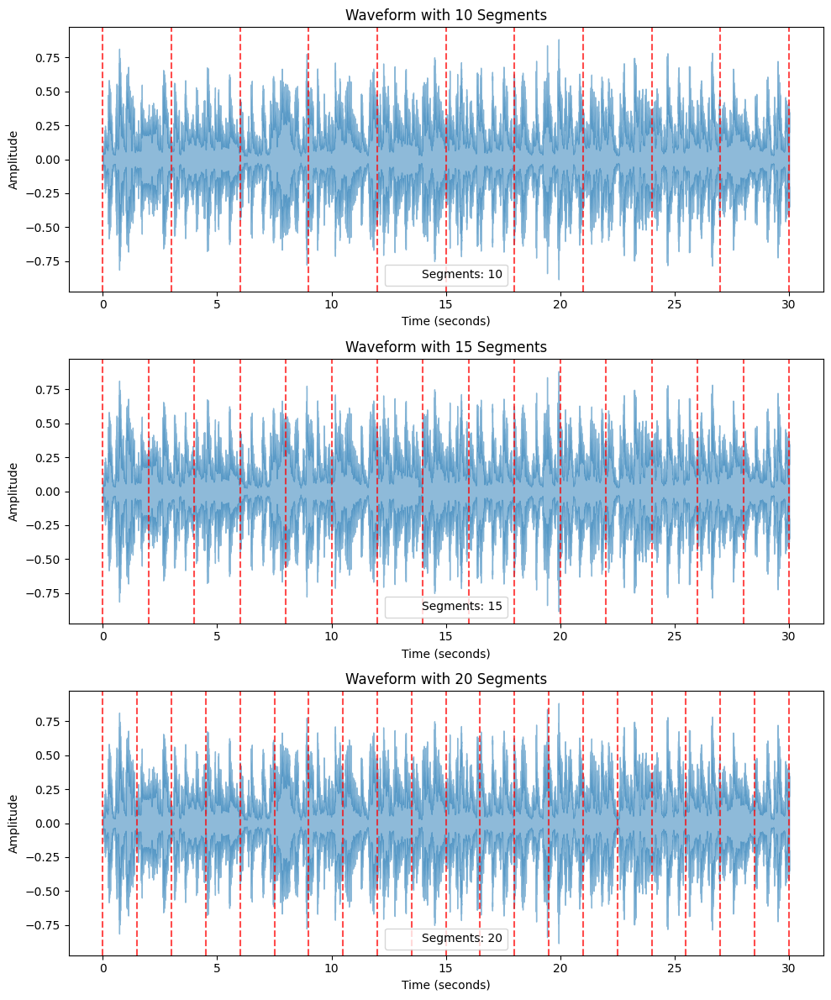

In [5]:
file_path = "dataset/blues/blues.00000.au"
signal, sr = librosa.load(file_path, sr=None)

def plot_waveform_with_segments(signal, sr, num_segments, ax):
    librosa.display.waveshow(signal, sr=sr, alpha=0.5, ax=ax)
    
    segment_duration = 30 / num_segments
    for i in range(num_segments + 1):
        segment_time = i * segment_duration
        ax.axvline(x=segment_time, color='r', linestyle='--', alpha=0.7)
    
    ax.set_xlabel("Time (seconds)")
    ax.set_ylabel("Amplitude")
    ax.set_title(f"Waveform with {num_segments} Segments")
    ax.legend([f"Segments: {num_segments}"])

fig, axes = plt.subplots(3, 1, figsize=(10, 12))

for ax, num_segments in zip(axes, [10, 15, 20]):
    plot_waveform_with_segments(signal, sr, num_segments, ax)

plt.tight_layout()
plt.show()

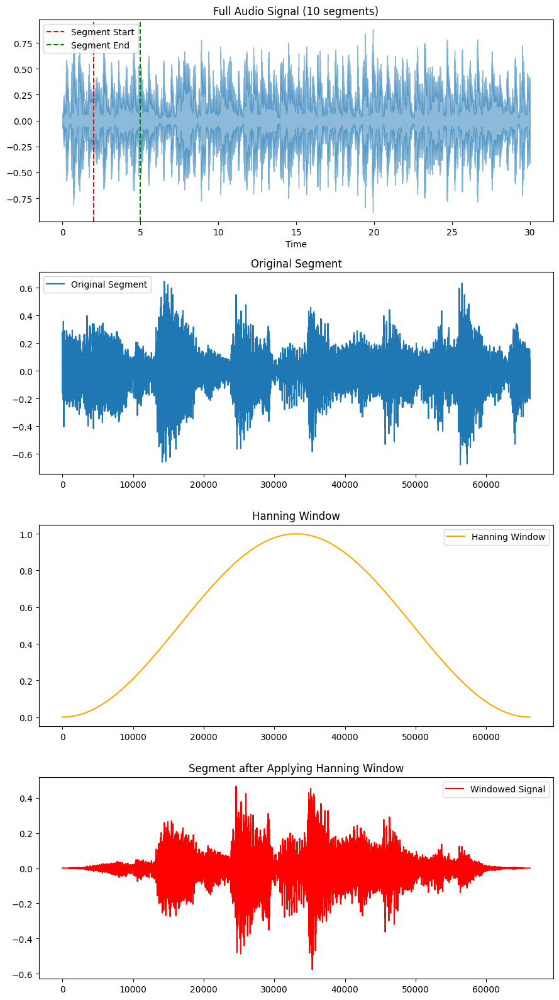

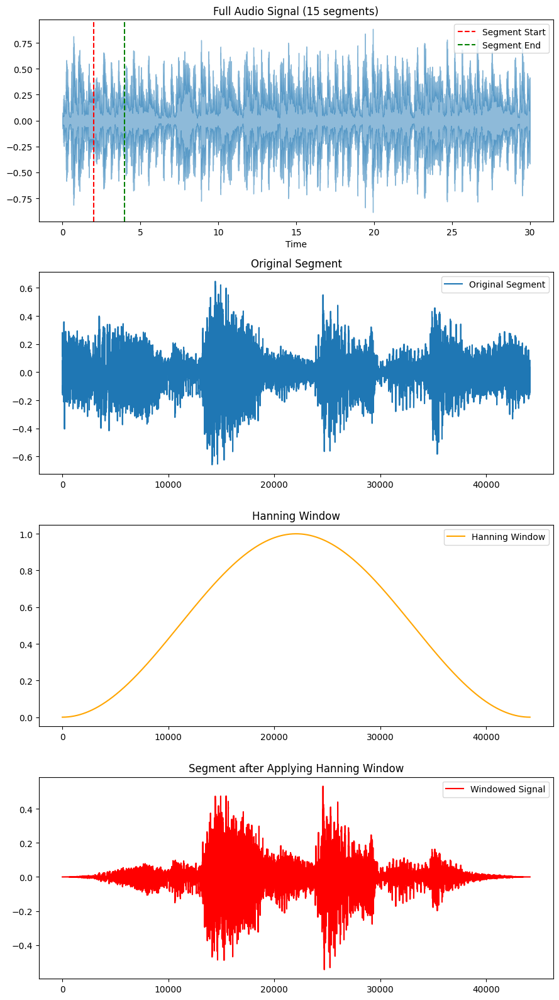

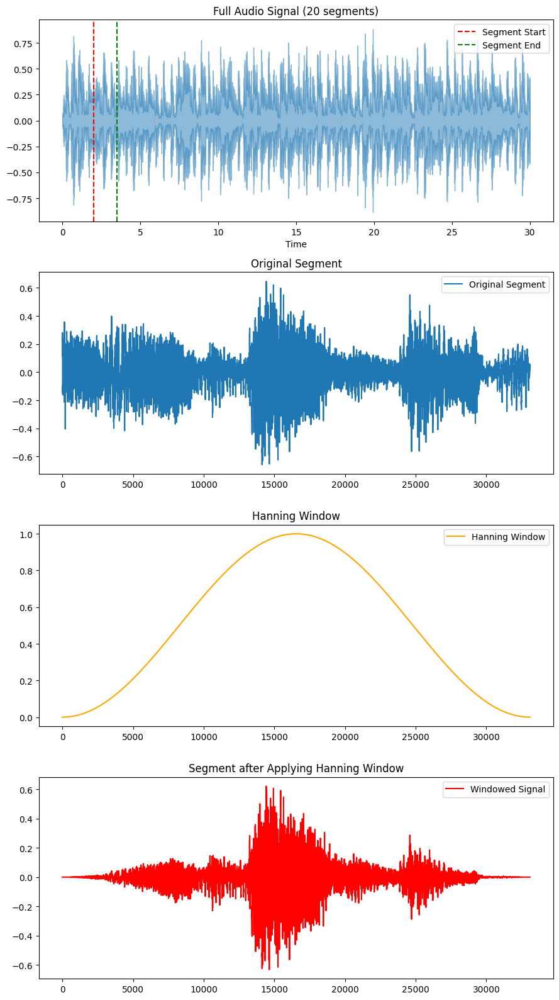

In [6]:
file_path = "dataset/blues/blues.00000.au"
signal, sr = librosa.load(file_path, sr=None)

num_segments_list = [10, 15, 20]

def plot_windowing_example(signal, sr, num_segments_list, start_time=0):
    for num_segments in num_segments_list:
        samples_per_segment = len(signal) // num_segments
        start_sample = int(start_time * sr)
        end_sample = start_sample + samples_per_segment
        segment_signal = signal[start_sample:end_sample]

        window = np.hanning(len(segment_signal))
        windowed_signal = segment_signal * window

        fig, axes = plt.subplots(4, 1, figsize=(9, 16))

        axes[0].set_title(f"Full Audio Signal ({num_segments} segments)")
        librosa.display.waveshow(signal, sr=sr, alpha=0.5, ax=axes[0])
        axes[0].axvline(x=start_sample / sr, color='r', linestyle='--', label="Segment Start")
        axes[0].axvline(x=end_sample / sr, color='g', linestyle='--', label="Segment End")
        axes[0].legend()

        axes[1].plot(segment_signal, label="Original Segment")
        axes[1].set_title(f"Original Segment")
        axes[1].legend()

        axes[2].plot(window, label="Hanning Window", color='orange')
        axes[2].set_title(f"Hanning Window")
        axes[2].legend()

        axes[3].plot(windowed_signal, label="Windowed Signal", color='red')
        axes[3].set_title(f"Segment after Applying Hanning Window")
        axes[3].legend()
        
        plt.tight_layout()
        plt.show()

plot_windowing_example(signal, sr, num_segments_list, start_time=2.0)

In [7]:
SEGMENT_VARIATIONS = [10, 15, 20]

def extract_mfcc(dataset_path, num_mfcc=13, n_fft=2048, hop_length=512, apply_window=True, overlap_ratio=0.5):
    for num_segments in SEGMENT_VARIATIONS:
        dataset = {"mapping": [], "labels": [], "mfcc": []}
        samples_per_segment = SAMPLES_PER_TRACK // num_segments
        step_size = int(samples_per_segment * (1 - overlap_ratio))
        expected_mfcc_length = math.ceil(samples_per_segment / hop_length)

        for dirpath, _, filenames in os.walk(dataset_path):
            if dirpath == dataset_path:
                continue

            genre_label = os.path.basename(dirpath)
            if genre_label not in dataset["mapping"]:
                dataset["mapping"].append(genre_label)
            label_idx = dataset["mapping"].index(genre_label)

            for filename in tqdm(filenames, desc=f"Processing {genre_label} ({num_segments} segmen)", unit="file"):
                signal, _ = librosa.load(os.path.join(dirpath, filename), sr=SAMPLE_RATE)
                
                for start_sample in range(0, len(signal) - samples_per_segment + 1, step_size):
                    segment_signal = signal[start_sample: start_sample + samples_per_segment]
                    if apply_window:
                        segment_signal *= np.hanning(len(segment_signal))
                    
                    mfcc = librosa.feature.mfcc(y=segment_signal, sr=SAMPLE_RATE, 
                                                n_mfcc=num_mfcc, n_fft=n_fft, hop_length=hop_length).T
                    if len(mfcc) == expected_mfcc_length:
                        dataset["mfcc"].append(mfcc.tolist())
                        dataset["labels"].append(label_idx)
        
        json_path = f"data_{num_segments}_segmen.json"
        with open(json_path, "w") as json_file:
            json.dump(dataset, json_file, indent=4)
        
        print(f"Ekstraksi MFCC selesai untuk {num_segments} segmen. Data disimpan dalam {json_path}")


if __name__ == "__main__":
    extract_mfcc(DATASET_PATH, apply_window=True, overlap_ratio=0.5)

Processing rock (10 segmen): 100%|██████████| 100/100 [00:15<00:00,  6.26file/s]


Ekstraksi MFCC selesai untuk 10 segmen. Data disimpan dalam data_10_segmen.json


Processing rock (15 segmen): 100%|██████████| 100/100 [00:16<00:00,  5.94file/s]


Ekstraksi MFCC selesai untuk 15 segmen. Data disimpan dalam data_15_segmen.json


Processing rock (20 segmen): 100%|██████████| 100/100 [00:23<00:00,  4.34file/s]


Ekstraksi MFCC selesai untuk 20 segmen. Data disimpan dalam data_20_segmen.json
